In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import pyarrow
from datetime import datetime
import simulations, utilities
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.cm as cm
import itertools
pv=!{sys.executable} --version
print(pv[0],'numpy ==', np.__version__, 'pyarrow ==',pyarrow.__version__, 'seaborn == ', sns.__version__)

Python 3.9.7 numpy == 1.20.3 pyarrow == 7.0.0 seaborn ==  0.11.2


In [2]:
# options
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
mpl.rcParams['figure.dpi'] = 300
sns.set_style("ticks")
sns.set_palette("cubehelix")
font_scale = 3
sns.set_context("paper", font_scale=font_scale, rc={"lines.linewidth": 3, 'aspect':1})

In [3]:
def plot_agg(df, ci=None, title = None, legend=True, sharey=False, x='A', ys=['Economic Gini', 'Knowledge Gini',  'Economic Median', 'Knowledge Median'], 
style='N', hue='K'):
    sns.set_context("paper", font_scale=3, rc={"lines.linewidth": 3, 'aspect':1})
    n = len(ys)
    fig, axs = plt.subplots(nrows=1, ncols=n, sharey=sharey)
    fig.set_figwidth(40)
    fig.set_figheight(10)
    for i in range(n):
        ax=sns.lineplot( x=x, y=ys[i], style=style, hue=hue, ci=ci, data=df, legend=legend, ax=axs[i]);       
    if title:
        fig.suptitle(title, fontsize=16)

In [4]:
def plot_agg2(df, ci=None, title = None, legend=True, sharey=False, hue=None,
              x='Knowledge Gini',ys=['Economic Gini'], 
              col='K', style=None):
    sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2, 'aspect':1})
    n = len(ys)
    for i in range(n):
        
        sns.relplot(kind="line", x=x, y=ys[i], style=style, hue=hue, ci=ci, col=col, data=df.sort_values(by=x), legend=legend);       
        

    if title:
        fig.subtitle(title, fontsize=16)

In [5]:
data = pd.read_parquet('simulations.SimulationNK_main_agg.parquet')
print(data.shape)
print(data.columns)
data.head()

(4200, 21)
Index(['Configuration', 'Run', 'A', 'K', 'N', 'Companies', 'Economic Gini',
       'Economic Median', 'Economic Q1', 'Economic Q3', 'Exploration Effort',
       'Exploration Norms', 'Initial Economic Stock', 'Knowledge Gini',
       'Knowledge Median', 'Knowledge Q1', 'Knowledge Q3', 'Seed',
       'Simulation Size', 'Simulation Time', 'Time Step'],
      dtype='object')


,Configuration,Run,A,K,N,Companies,Economic Gini,Economic Median,Economic Q1,Economic Q3,Exploration Effort,Exploration Norms,Initial Economic Stock,Knowledge Gini,Knowledge Median,Knowledge Q1,Knowledge Q3,Seed,Simulation Size,Simulation Time,Time Step
0,0,0,0.600,1,2,100,0.914,0.000,0.000,0.000,10,0.100,100,0.235,0.494,0.281,0.494,0,100,50,50
1,0,1,0.600,1,2,100,0.946,0.000,0.000,0.000,10,0.100,100,0.253,0.295,0.239,0.611,1,100,50,50
2,0,2,0.600,1,2,100,0.845,0.000,0.000,3.000,10,0.100,100,0.244,0.518,0.233,0.671,2,100,50,50
3,0,3,0.600,1,2,100,0.861,0.000,0.000,1.750,10,0.100,100,0.153,0.505,0.399,0.813,3,100,50,50
4,0,4,0.600,1,2,100,0.990,0.000,0.000,0.000,10,0.100,100,0.514,0.039,0.039,0.540,4,100,50,50


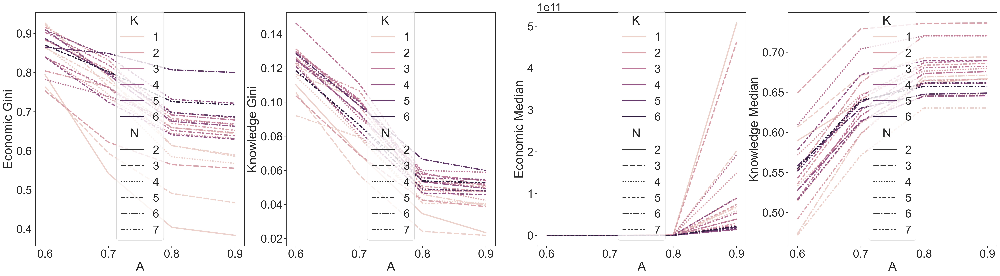

In [21]:
plot_agg(data)

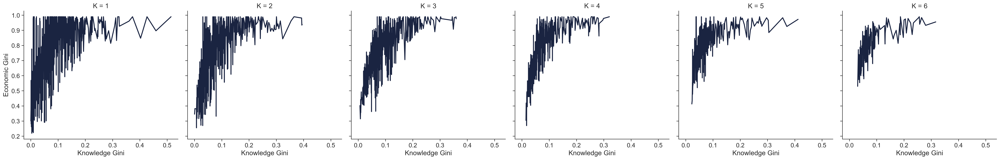

In [7]:
plot_agg2(data,  legend=True)

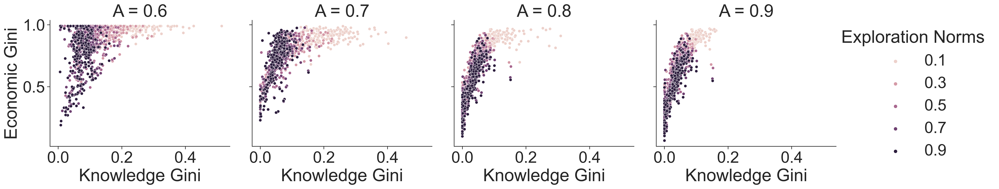

In [30]:
sns.relplot(kind="scatter", x='Knowledge Gini', y='Economic Gini', hue='Exploration Norms', ci=None, col='A',  data=data, legend=True);       

In [37]:
sns.relplot(kind="scatter", x='Knowledge Gini', y='Economic Gini', hue='Exploration Norms', ci=None, col='N', row='K', data=data, legend=True);       

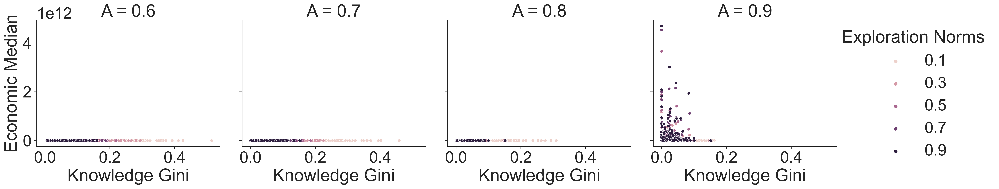

In [36]:
sns.relplot(kind="scatter", x='Knowledge Gini', y='Economic Median', hue='Exploration Norms', ci=None, col='A', data=data, legend=True);       

In [29]:
sns.relplot(kind="scatter", x='Knowledge Gini', y='Economic Gini', hue='Exploration Norms', ci=None, col='A', row='K', data=data, legend=True);       

In [ ]:
sns.relplot(kind="scatter", x='Knowledge Gini', y='Economic Gini', hue='Exploration Norms', ci=None, col='N', row='K', data=data, legend=True);       

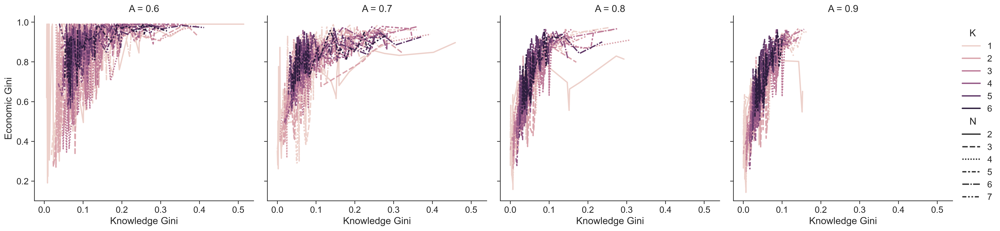

In [8]:
# plot the relationship between the two gini coefficients
sns.relplot(kind="line", x='Knowledge Gini', y='Economic Gini', style='N', hue='K', ci=None, col='A', data=data.sort_values(by='Knowledge Gini'), legend=True);

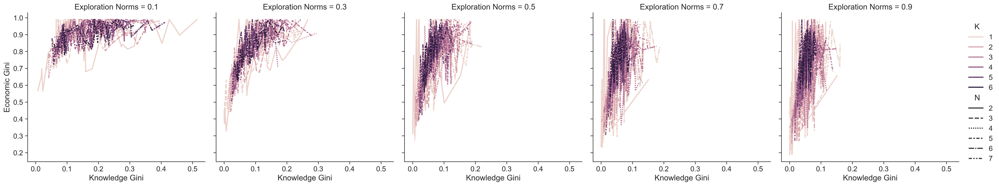

In [9]:
sns.relplot(kind="line", x='Knowledge Gini', y='Economic Gini', style='N', hue='K', ci=None, col='Exploration Norms', data=data.sort_values(by='Knowledge Gini'), legend=True);

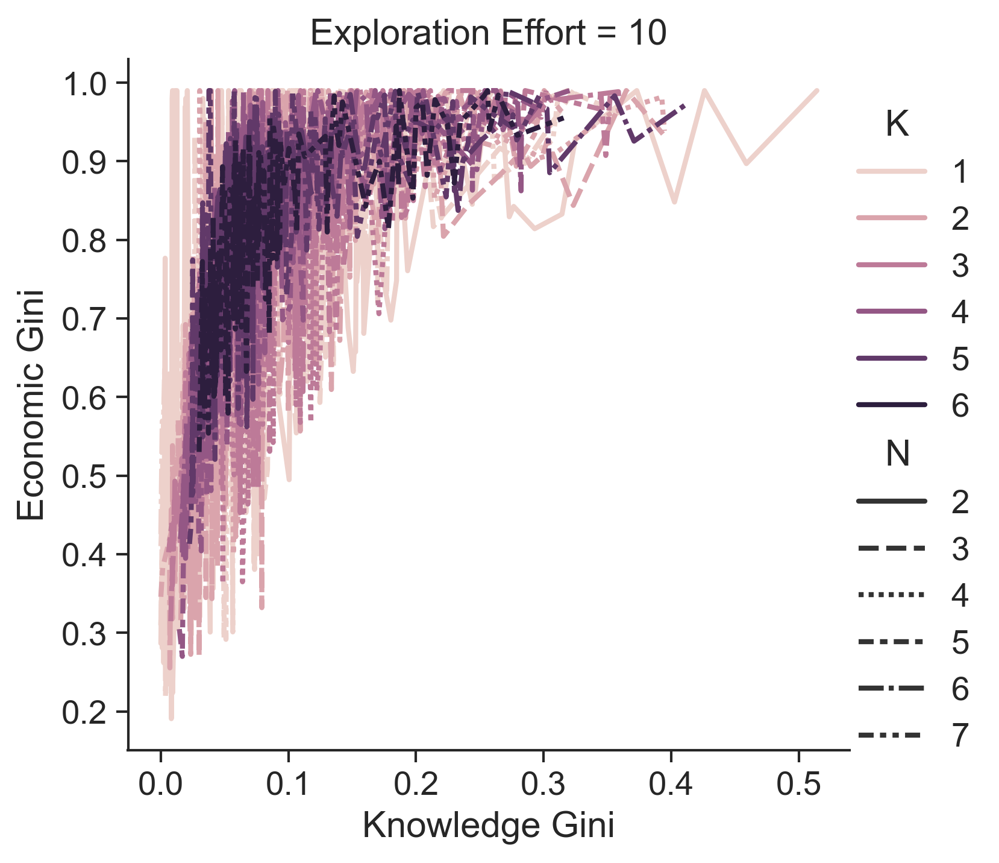

In [10]:
sns.relplot(kind="line", x='Knowledge Gini', y='Economic Gini', style='N', hue='K', ci=None, col='Exploration Effort', data=data.sort_values(by='Knowledge Gini'), legend=True);

Text(0.5, 0.92, 'Knowledge vs Economic Gini')

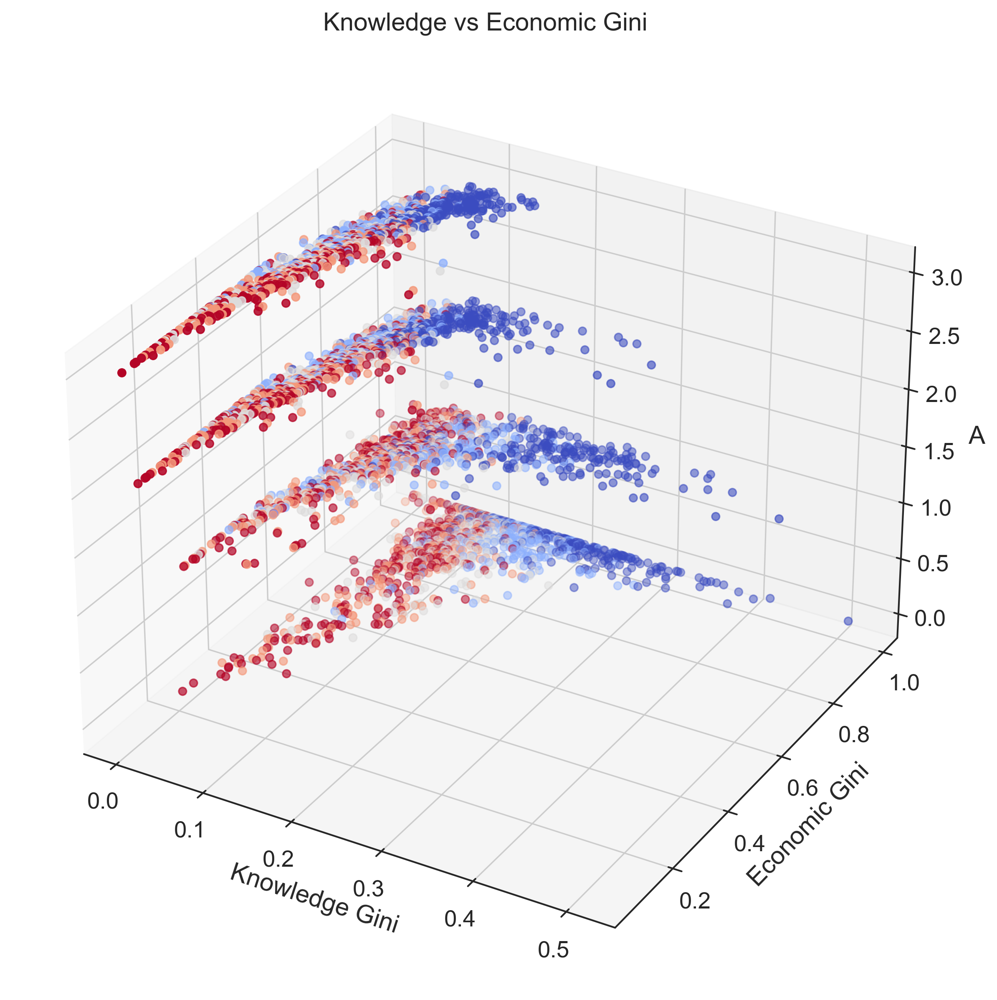

In [11]:
# create a 3d plot of the relationship between the two gini coefficients
df = data.copy()
df['Exploration Norms'] = df['Exploration Norms'].astype('category')
df['Exploration Effort'] = df['Exploration Effort'].astype('category')
df['N'] = df['N'].astype('category')
df['K'] = df['K'].astype('category')
df['A'] = df['A'].astype('category')

df['Exploration Norms'] = df['Exploration Norms'].cat.codes
df['Exploration Effort'] = df['Exploration Effort'].cat.codes
df['N'] = df['N'].cat.codes
df['K'] = df['K'].cat.codes
df['A'] = df['A'].cat.codes

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(  df['Knowledge Gini'],   df['Economic Gini'],df['A'], c=df['Exploration Norms'], cmap=cm.coolwarm, marker='o')
ax.set_xlabel('Knowledge Gini')
ax.set_ylabel('Economic Gini')
ax.set_zlabel('A')
ax.set_title('Knowledge vs Economic Gini')

In [18]:
def plot3dsurface(data, x, y, z, elev=10, azim=120):
    sns.set_context("paper", font_scale=0.8, rc={"lines.linewidth": 2, 'aspect':1})
    data1 = data[(data.N == 5) & (data.K==1)]
    data2 = data[(data.N == 5) & (data.K==4)]

    data1 = data1.groupby([x, y])[[z]].mean().reset_index()
    data2 = data2.groupby([x, y])[[z]].mean().reset_index()

    ax = plt.axes(projection='3d')
    ax.scatter(data1[x], data1[y], data1[z], cmap=None, alpha=0.7, edgecolor='black', linewidth=0.1);
    ax.scatter(data2[x], data2[y], data2[z], cmap=None, alpha=0.7, edgecolor='black', linewidth=0.1);

    ax.view_init(elev, azim)    
    ax.set(xlabel=x, ylabel =y, zlabel=z)
    sns.set_context("paper", font_scale=font_scale, rc={"lines.linewidth": 2, 'aspect':1})
    return ax

<Axes3DSubplot:xlabel='Exploration Norms', ylabel='Knowledge Gini'>

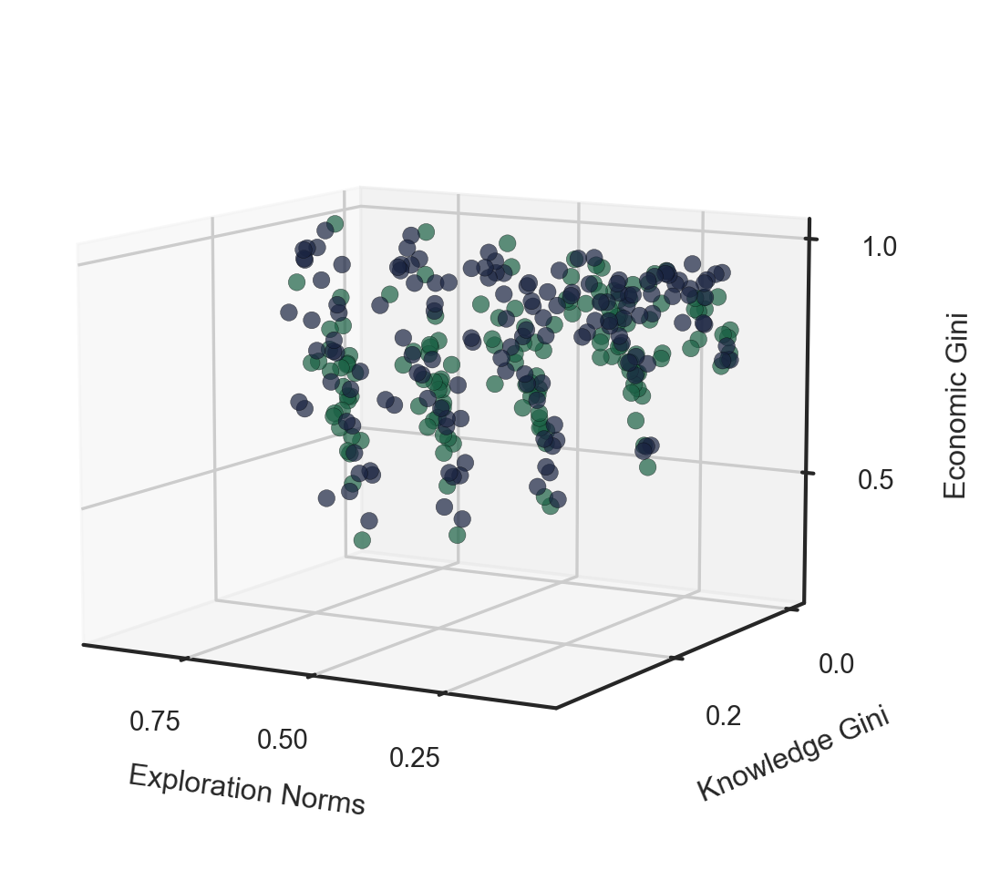

In [19]:
plot3dsurface(data, 'Exploration Norms', 'Knowledge Gini', 'Economic Gini')

In [14]:
data.dtypes

Configuration               int64
Run                         int64
A                         float64
K                           int64
N                           int64
Companies                   int64
Economic Gini             float64
Economic Median           float64
Economic Q1               float64
Economic Q3               float64
Exploration Effort          int64
Exploration Norms         float64
Initial Economic Stock      int64
Knowledge Gini            float64
Knowledge Median          float64
Knowledge Q1              float64
Knowledge Q3              float64
Seed                        int64
Simulation Size             int64
Simulation Time             int64
Time Step                   int64
dtype: object